In [ ]:
!nvidia-smi

Thu May 25 20:07:33 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls

drive  sample_data


In [ ]:
!cp -r "/content/drive/MyDrive/avito auto/auto-10k" .

In [ ]:
import os
import random
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight

from tqdm.notebook import tqdm
from IPython.display import clear_output

from PIL import Image

import torch
import torchvision
import torch.optim as optim
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
from torchvision import datasets, models
from torch.optim import lr_scheduler

%matplotlib inline
warnings.simplefilter('ignore')

In [ ]:
SEED = 42
BATCH_SIZE = 8
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

MAPPING = {0: 'Стандартный',
          #1: 'Открытые двери',
          1: 'Вид сбоку',
          2: 'Вид сзади',
          3: 'Вид спереди',
          #5: 'Нет машины',
          4: 'другое',
          -1: 'Не загрузилось фото'}

IMAGES_DIR = "/content/drive/MyDrive/avito auto/auto-10k"
ANNOTATIONS_FILE = '/content/drive/MyDrive/Colab Notebooks/work/avito/aggregated_results_all.csv'
RAW_URLS_FILE = '/content/drive/MyDrive/Colab Notebooks/work/avito/raw_urls.csv'

In [ ]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
seed_everything(SEED)

In [ ]:
annot = pd.read_csv(ANNOTATIONS_FILE)
raw_urls = pd.read_csv(RAW_URLS_FILE, sep=';')

In [ ]:
annot['OUTPUT:result'] = annot['OUTPUT:result'] - 1

## Удалим открытые двери из датасета и объединим "другое" и "нет машины" метки

In [ ]:
annot

,INPUT:image,OUTPUT:result
0,https://drive.google.com/uc?id=1WkGuHARejVFCXu...,0
1,https://drive.google.com/uc?id=1b88BofRfjwhYMj...,2
2,https://drive.google.com/uc?id=1z2EB6yDComE_pu...,0
3,https://drive.google.com/uc?id=1j7Kz6ck9NNXJVR...,6
4,https://drive.google.com/uc?id=14b3MIN6iCUJ37_...,4
...,...,...
2550,https://drive.google.com/uc?id=13PLa-bfTvQpR4K...,6
2551,https://drive.google.com/uc?id=1KuQTgCaK53Ccn-...,4
2552,https://drive.google.com/uc?id=1nX-D5CAluh8pqo...,0
2553,https://drive.google.com/uc?id=1KEDO0Fd8MrA70R...,6


In [ ]:
annot = pd.merge(raw_urls, annot, on='INPUT:image')
annot = annot[annot['OUTPUT:result'] != -2]
annot = annot[annot['OUTPUT:result'] != 1]
annot['OUTPUT:result'] = annot['OUTPUT:result'].replace({2:1, 3:2, 4:3, 5:4, 6:4})


annot['label'] = annot['OUTPUT:result'].map(MAPPING) 

annot['image_name'] = annot['image_name'].map(lambda file: os.path.join(IMAGES_DIR, file))

In [ ]:
#всего фото
len(annot)

2499

In [ ]:
def plot_samples(images, labels, nrows=3, ncols=3, transforms=None):

    f, axes = plt.subplots(nrows=nrows, ncols=nrows,)
    f.set_figheight(9)
    f.set_figwidth(12)

    for image_file, label, ax in zip(images, labels, axes.flatten()):
        im = plt.imread(image_file)
        im = transforms(im).permute((1,2,0)) if transforms else im 
        ax.imshow(im, cmap='gray')
        ax.set_title(label)
        ax.axis('off')

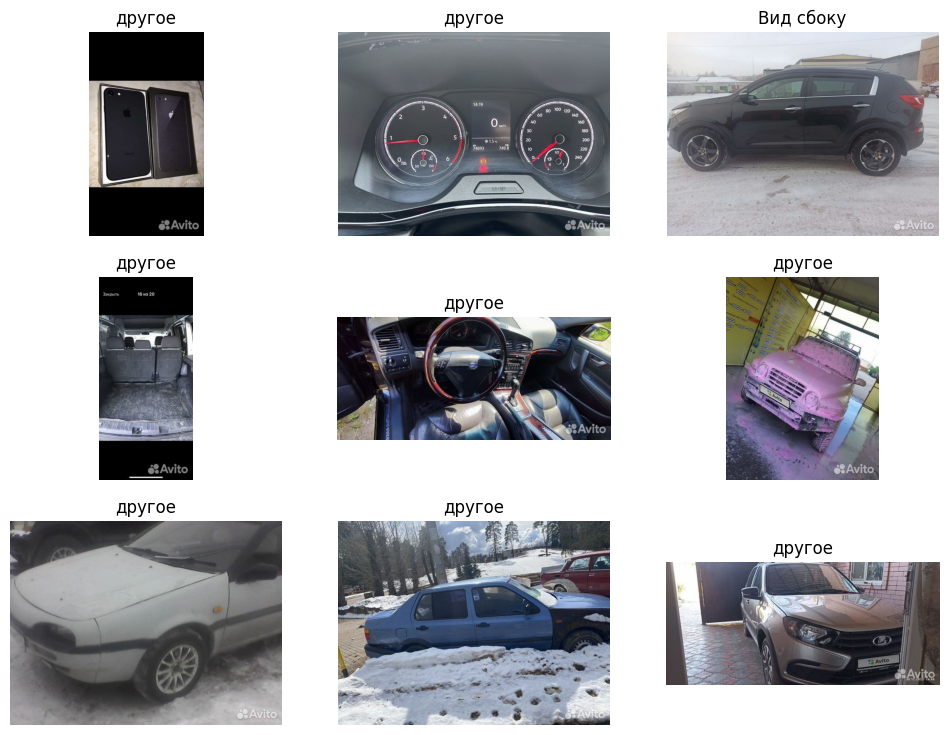

In [ ]:
sample = annot.sample(9, random_state=14)
plot_samples(sample['image_name'], sample['label'])

In [ ]:
MEAN = np.array([0.485, 0.456, 0.406])
STD = np.array([0.229, 0.224, 0.225])

train_transforms = T.Compose([
    T.ToPILImage(),
    T.Resize(size=(288, 288), interpolation=T.InterpolationMode.BICUBIC),
    
    T.ColorJitter(hue=.1, saturation=.1),
    T.GaussianBlur((5, 9)),
    T.RandomPerspective(distortion_scale=0.2, p=0.3),
    T.RandomRotation(15),
    T.RandomInvert(p=0.3),
    
    T.ToTensor(),     
    T.Normalize(MEAN, STD)
])

val_transforms = T.Compose([
    T.ToPILImage(),
    T.Resize(size=(288, 288), interpolation=T.InterpolationMode.BICUBIC),
    
    T.ToTensor(),
    T.Normalize(MEAN, STD)
])

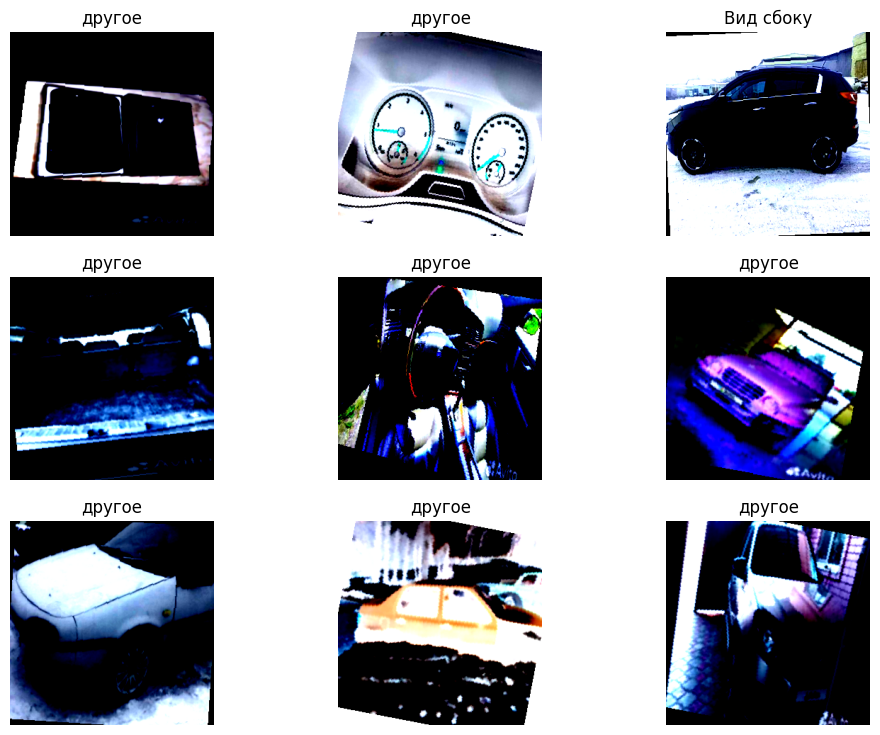

In [ ]:
sample = annot.sample(9, random_state=14)
plot_samples(sample['image_name'], sample['label'], transforms=train_transforms)

In [ ]:
class ImageDataset(Dataset):
    
    def __init__(self, images, labels, mode='train'):
        
        super(ImageDataset).__init__()
        self.images = images
        self.labels = labels
        self.mode = mode
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, index):
        
        if self.mode == 'train' or self.mode == 'val':
            
            x = self.read_image(file=self.images[index])
            y = torch.zeros(5)
            y[self.labels[index]] = 1
            return x, y
        
        else:
            x = self.read_image(file=self.images[index])
            return x
        
    def preprocess_image(self, img):
        
        if self.mode == 'train':
            img = train_transforms(img)
        else:
            img = val_transforms(img)
        
        return img   
          
    
    def read_image(self, file):
        img = plt.imread(file)
        img = self.preprocess_image(img)
        return img

### Сохраним баланс классов в train и тест, использовав `stratified train_test_split`

In [ ]:
train_images, val_images, train_labels, val_labels = train_test_split(annot['image_name'].values,
                                                                      annot['OUTPUT:result'].values,
                                                                      #stratify=annot['OUTPUT:result'].values,
                                                                      random_state=14, test_size=0.2)

train_dataset = ImageDataset(train_images, train_labels, mode='train')
val_dataset = ImageDataset(val_images, val_labels, mode='val')

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True)

In [ ]:
def plot_progress(train_losses, train_accuracy, test_loss, test_accuracy):
    clear_output(True)
    
    f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2)
    f.set_figheight(6)
    f.set_figwidth(18)
    
    ax1.plot(train_losses, label='train loss')
    ax1.plot(test_loss, label='test loss')
    ax1.plot(np.zeros_like(train_losses), '--', label='zero')
    
#     Для ограничения графика loss можно пользоваться set_ylim:
    ax1.set_ylim([-0.05, 2])

    ax1.set_title('Loss')
    ax1.set_ylabel('Loss')
    ax1.set_xlabel('Epoch number')
    ax1.legend()
    
    ax2.plot(train_accuracy, label='train accuracy')
    ax2.plot(test_accuracy, label='test accuracy')
    ax2.plot(np.ones_like(train_accuracy), '--', label='100% accuracy')
    ax2.plot(np.ones_like(train_accuracy) * 0.5, '--', label='50% accuracy')
    ax2.set_title('accuracy')
    ax2.set_ylabel('accuracy')
    ax2.set_xlabel('Epoch number')
    ax2.legend()

    plt.show()

In [ ]:
torch.cuda.empty_cache()
import gc
gc.collect()

43943

In [ ]:
model = torchvision.models.efficientnet_b2(pretrained=True)
model.classifier[1] = torch.nn.Linear(in_features=1408, out_features=5)
model.classifier.append(torch.nn.Softmax())

for i, param in enumerate(model.parameters()):
    if i > 250:
        param.requires_grad = True

model = model.to(DEVICE)

Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-bcdf34b7.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-bcdf34b7.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 304MB/s]


In [ ]:
class_weights = compute_class_weight('balanced', classes=np.unique(train_labels), y=train_labels)
class_weights = torch.tensor(class_weights, dtype=torch.float)

In [ ]:
class_weights

tensor([0.6765, 1.7459, 3.3597, 0.9823, 0.6123])

In [ ]:
np.unique(train_labels)

array([0, 1, 2, 3, 4])

In [ ]:
torch.cuda.empty_cache()
gc.collect()

21

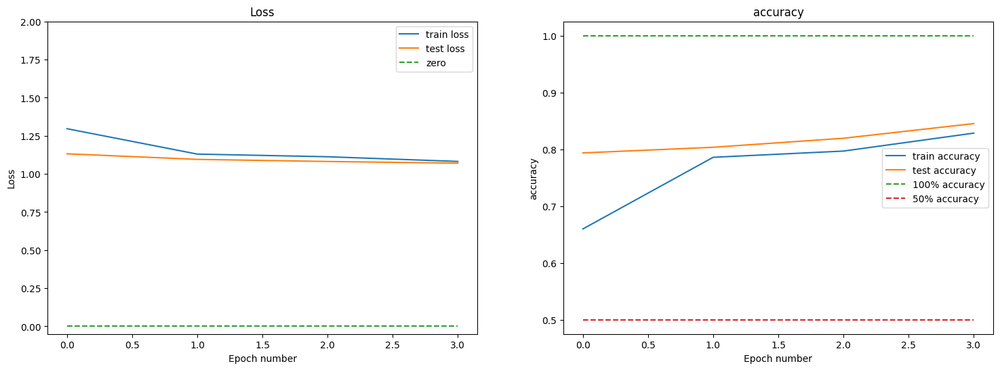

In [ ]:
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)
criterion = torch.nn.CrossEntropyLoss()

n_epochs = 25

train_losses = []
train_acc = []

val_losses = []
val_acc = []


best_loss = float('inf')

for epoch in tqdm(range(n_epochs)):
    
    train_loss_agg = []
    train_acc_agg = []
    
    for data_train, target_train in tqdm(train_dataloader):
        
        model.train()
        
        data_train = data_train.to(DEVICE)
        target_train = target_train.to(DEVICE)
        
        optimizer.zero_grad()

        train_preds = model(data_train)

        train_loss = criterion(train_preds, torch.argmax(target_train, dim=1))
        
        train_loss_agg.append(train_loss.item())
        
        train_acc_agg.append(accuracy_score(target_train.cpu().detach().argmax(1),
                                            train_preds.cpu().detach().argmax(1)))
        
        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()
    
        
    train_epoch_loss = sum(train_loss_agg) / len(train_loss_agg)
    train_epoch_acc = sum(train_acc_agg) / len(train_acc_agg)
    
    train_losses.append(train_epoch_loss)
    train_acc.append(train_epoch_acc)
    
    model.eval() 
    
    val_loss_agg = []
    val_acc_agg = []
    
    for x_val, y_val in tqdm(val_dataloader):      
        
        x_val = x_val.to(DEVICE)
        y_val = y_val.to(DEVICE)
        
        with torch.no_grad():
            val_preds = model(x_val)
            val_loss = criterion(val_preds, torch.argmax(y_val, dim=1))
            val_loss_agg.append(val_loss.item())
        
            val_acc_agg.append(accuracy_score(y_val.cpu().detach().argmax(1),
                                              val_preds.cpu().detach().argmax(1)))

    
    val_epoch_loss = sum(val_loss_agg) / len(val_loss_agg)
    val_epoch_acc = sum(val_acc_agg) / len(val_acc_agg)
    
    val_losses.append(val_epoch_loss)
    val_acc.append(val_epoch_acc)
    
    if val_epoch_loss < best_loss:
        best_loss = val_epoch_loss
        torch.save(model.state_dict(), f'model_best_loss_{epoch}_{val_epoch_acc:.4f}.pt')
    

    plot_progress(train_losses, train_acc, val_losses, val_acc)

In [ ]:
model.load_state_dict(torch.load('/content/model_best_loss_11_0.8909.pt'))

<All keys matched successfully>

In [ ]:
preds = []
model.eval()
for image in tqdm(val_images):  
  
  im_arr = plt.imread(image)
  im_prep = val_transforms(im_arr)

  pred = model(im_prep.to(DEVICE).unsqueeze(0))[0].argmax()
  preds.append(int(pred.cpu()))

  0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
accuracy_score(preds, val_labels)

0.892

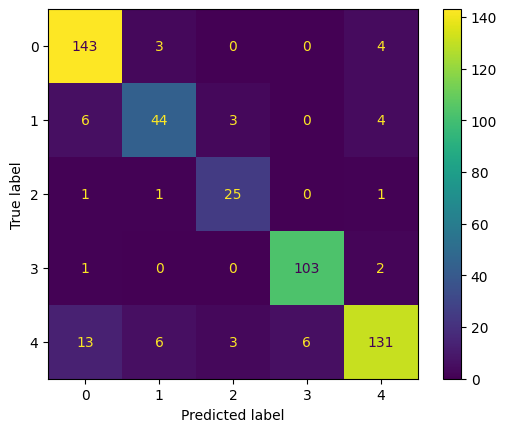

In [ ]:
cm = confusion_matrix(val_labels, preds, labels=np.unique(val_labels))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=np.unique(val_labels))
disp.plot()

In [ ]:
true_pos = np.diag(cm) 
precision = true_pos / np.sum(cm, axis=0)
recall = true_pos / np.sum(cm, axis=1)

### Важнее всего метрика recall: мы не хотим обрезать авто неподходящего ракурса или емли его вообще нет,в то же время попросить пользователя загрузить другое фото совсем не проблема 

In [ ]:
precision

array([0.87195122, 0.81481481, 0.80645161, 0.94495413, 0.92253521])

In [ ]:
recall

array([0.95333333, 0.77192982, 0.89285714, 0.97169811, 0.82389937])

Перепутать метки "другое" и "нет машины" не критично, машин с открытыми дверьми оказалось крайне мало (7 на больше чем 2500 фото, поэтому результаты очень неплохие)

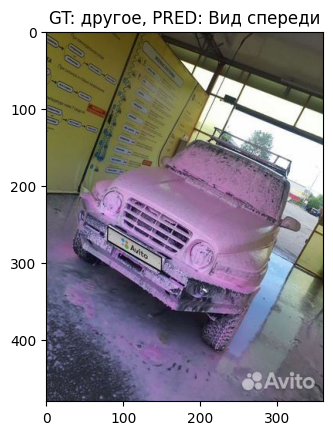

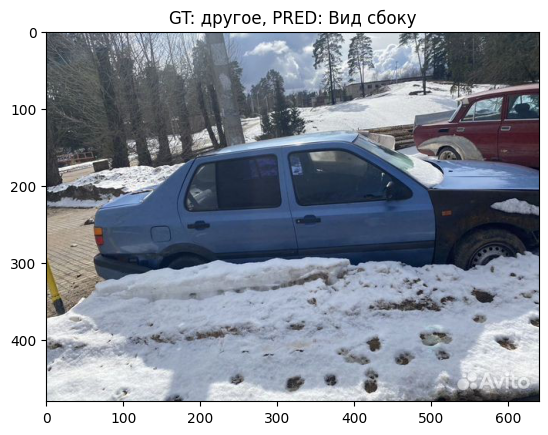

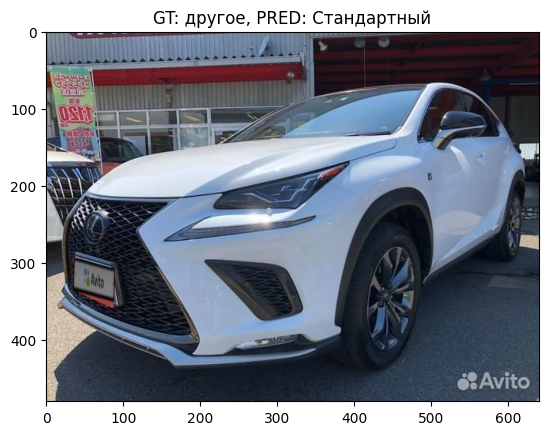

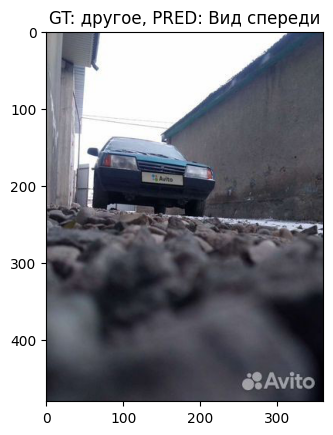

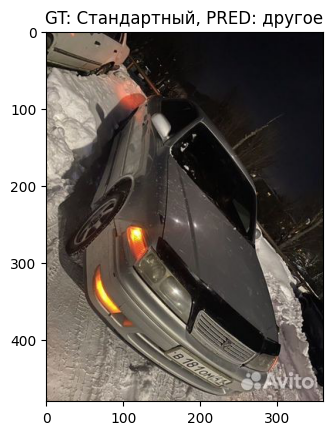

...

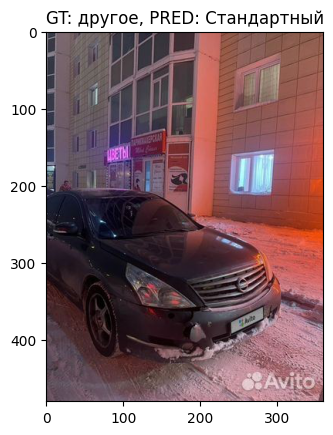

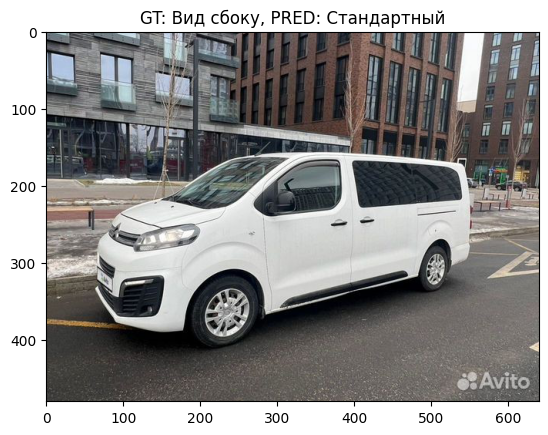

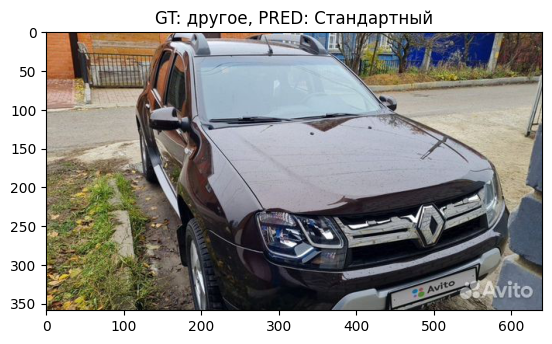

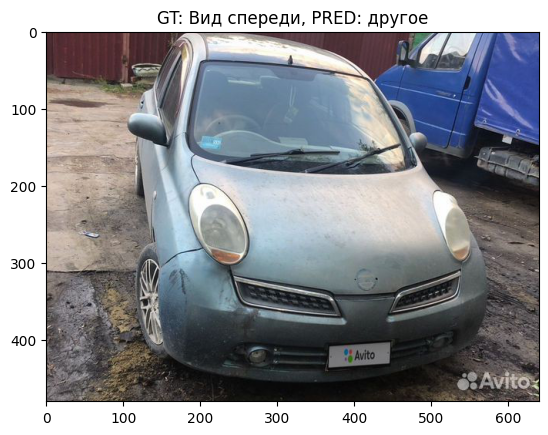

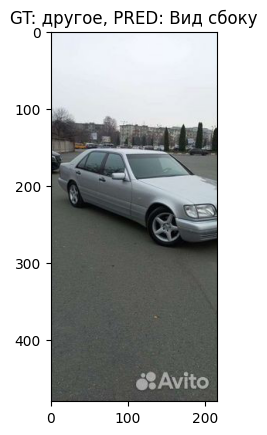

In [ ]:
for idx, (pred, label) in enumerate(zip(preds, val_labels)):

  if pred != label:
    image = plt.imread(val_images[idx])
    plt.imshow(image)
    plt.title(f'GT: {MAPPING[label]}, PRED: {MAPPING[pred]}')
    plt.show()

In [ ]:
from scipy.stats import entropy
import glob

In [ ]:
images_all = sorted(glob.glob(os.path.join(IMAGES_DIR, '*.jpg')))

In [ ]:
dataset_all = ImageDataset(images_all, None, mode='test')
dataloader_all = torch.utils.data.DataLoader(dataset_all, batch_size=32, shuffle=False)

In [ ]:
entropy_values = []

for image in tqdm(images_all):

  image_arr = plt.imread(image)
  im_prep = val_transforms(image_arr)

  pred = model(im_prep.to(DEVICE).unsqueeze(0)).cpu()[0]

  H = entropy(pred.detach().numpy())
  entropy_values.append(H)

In [ ]:
outputs = []
entropy_values = []

for data in tqdm(dataloader_all):
    with torch.no_grad():
        data = data.to(DEVICE)
        output = model(data)
        
        for pred in output:
          H = entropy(pred.cpu().numpy())
          entropy_values.append(H)
          outputs.append(pred.cpu().argmax())
          

In [ ]:
outputs_list = list(map(int, outputs))

In [ ]:
result_df = pd.DataFrame({'image': images_all, 'predict': outputs_list, 'entropy': entropy_values})

In [ ]:
result_df

In [ ]:
sorted_by_entropy = result_df.sort_values(by='entropy', ascending=False)

In [ ]:
idx = 8506

plt.imshow(plt.imread(sorted_by_entropy['image'].iloc[idx]))
plt.title(MAPPING[sorted_by_entropy['predict'].iloc[idx]])
plt.show()

In [ ]:
result_df['image'] = result_df['image'].map(lambda image: image.split('/')[-1])

In [ ]:
result_df.to_csv('predict.csv', index=None)

In [ ]:
!cp /content/predict.csv /content/drive/MyDrive/avito/project

In [ ]:
!cp /content/model_best_loss_2_0.7604.pt /content/drive/MyDrive/avito/project

In [ ]:
sorted_by_entropy